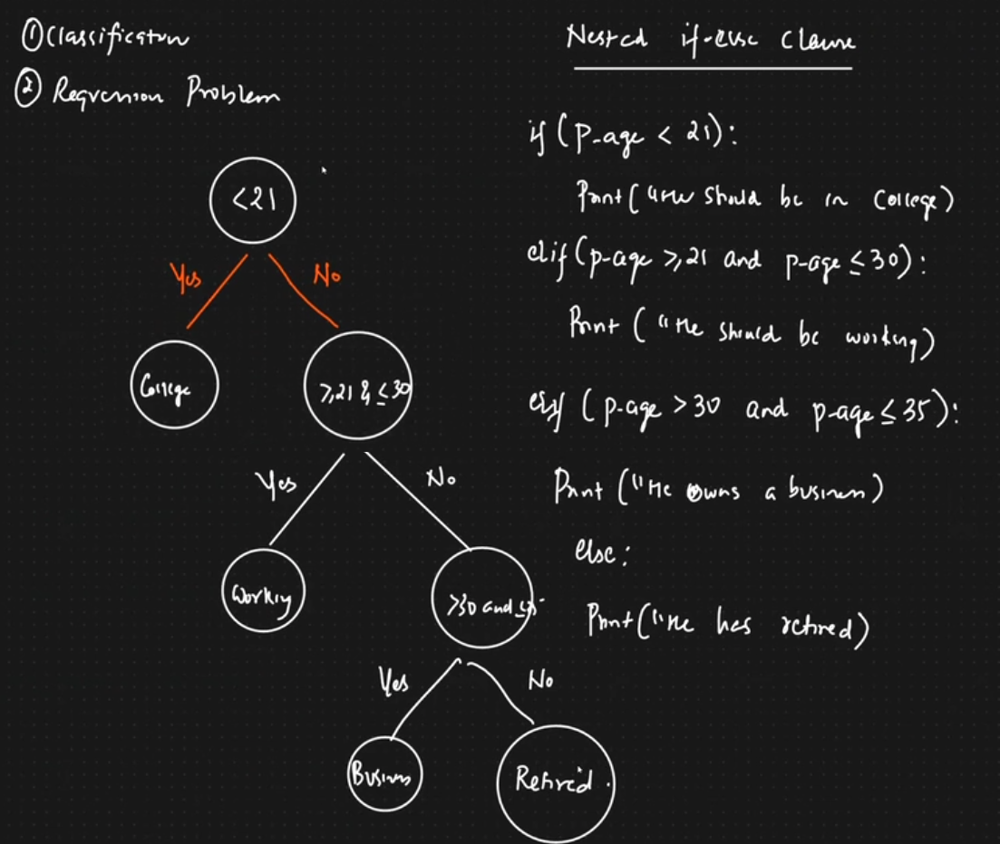

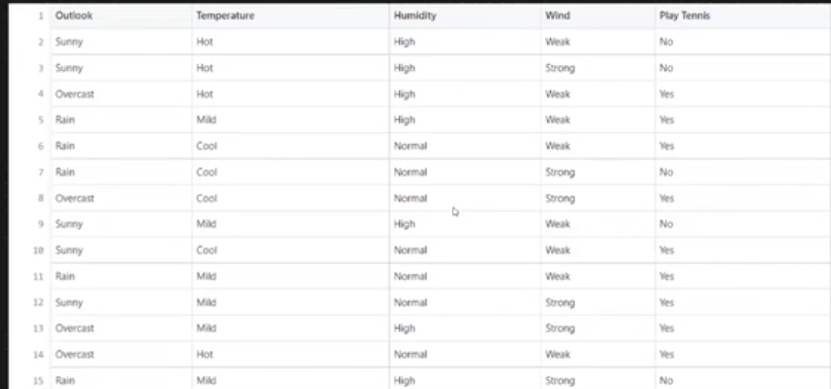

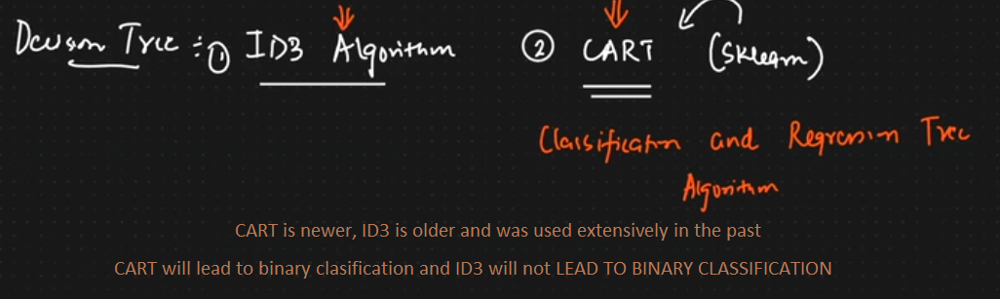

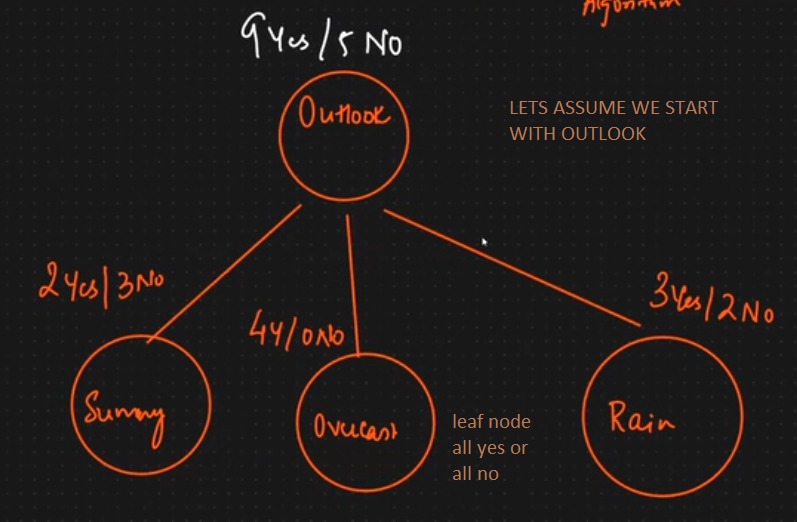

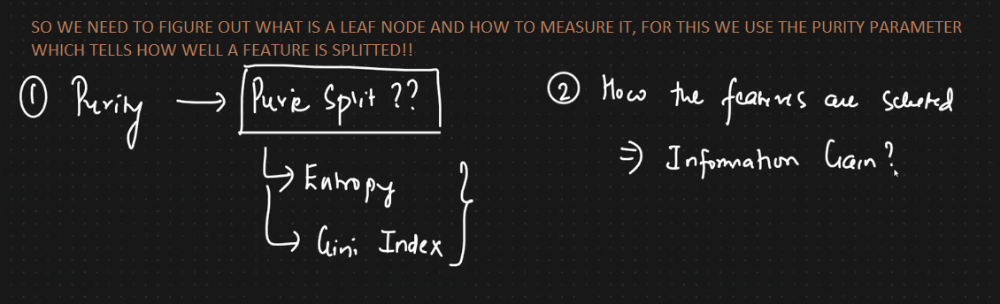

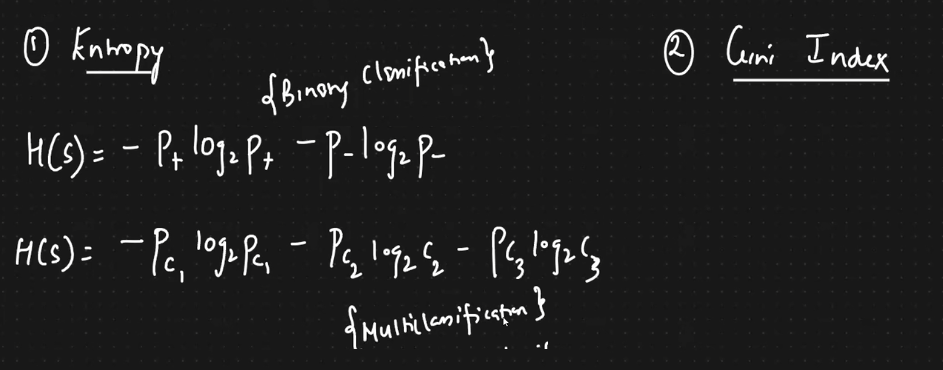

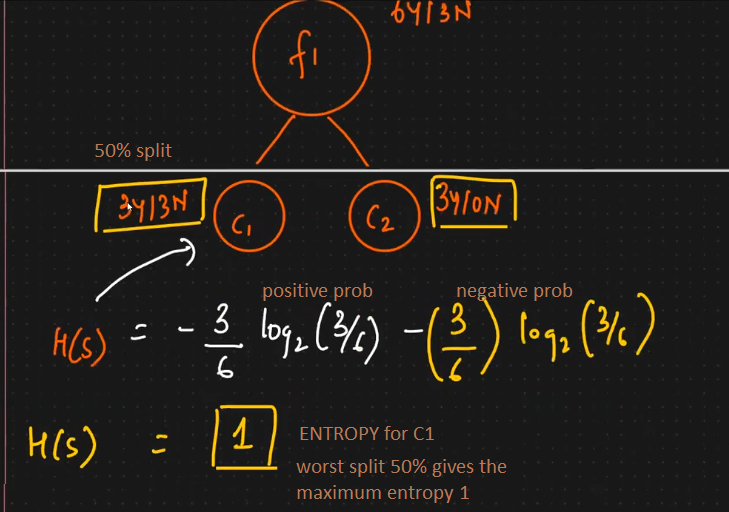

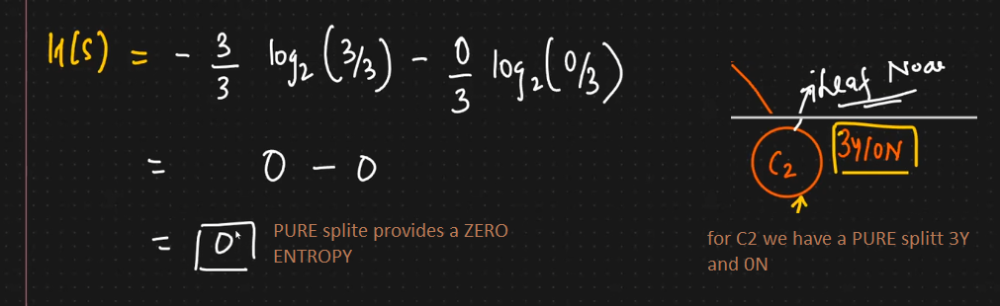

* Example for impurity definition
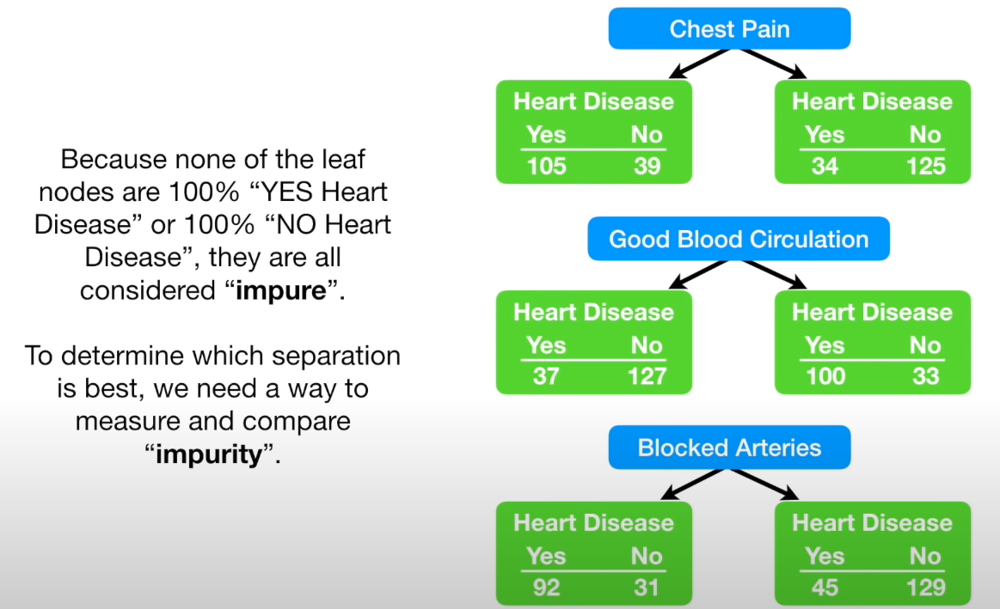

* for this example impure split

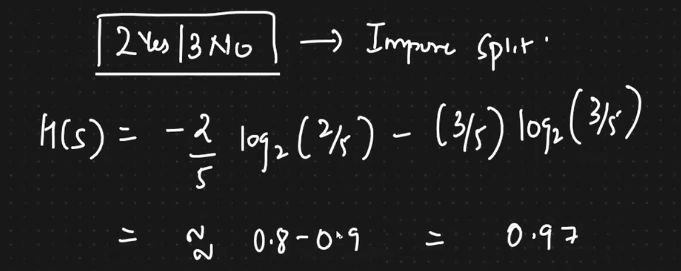

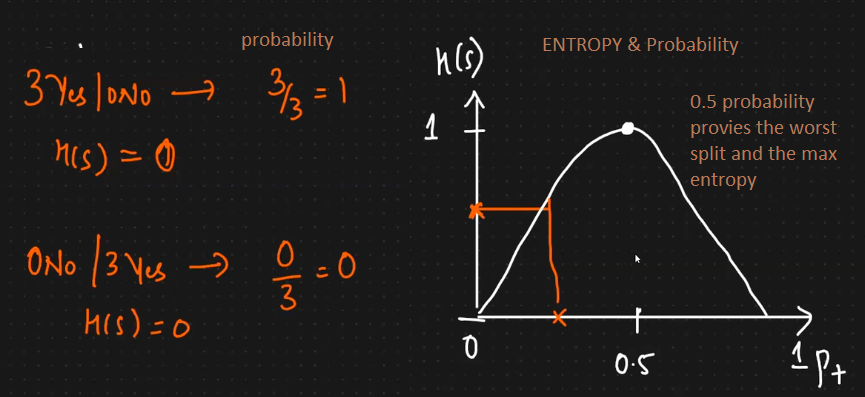

### GINI index

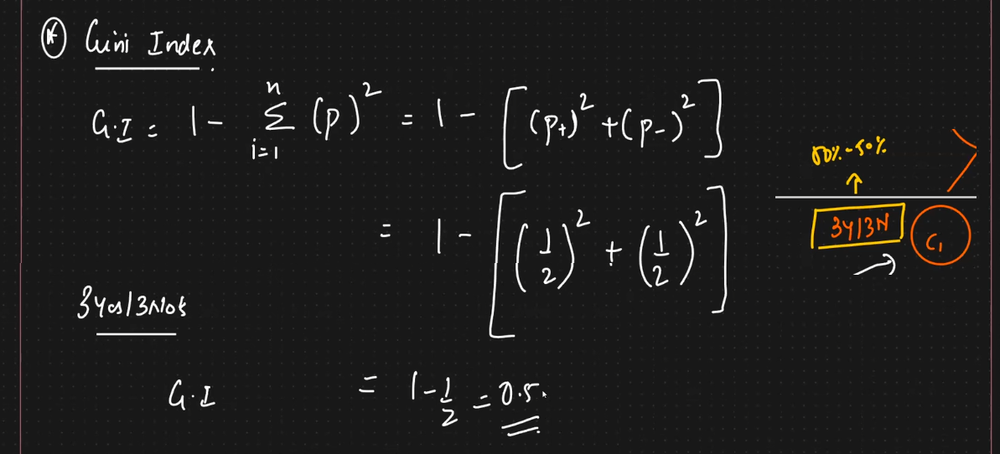

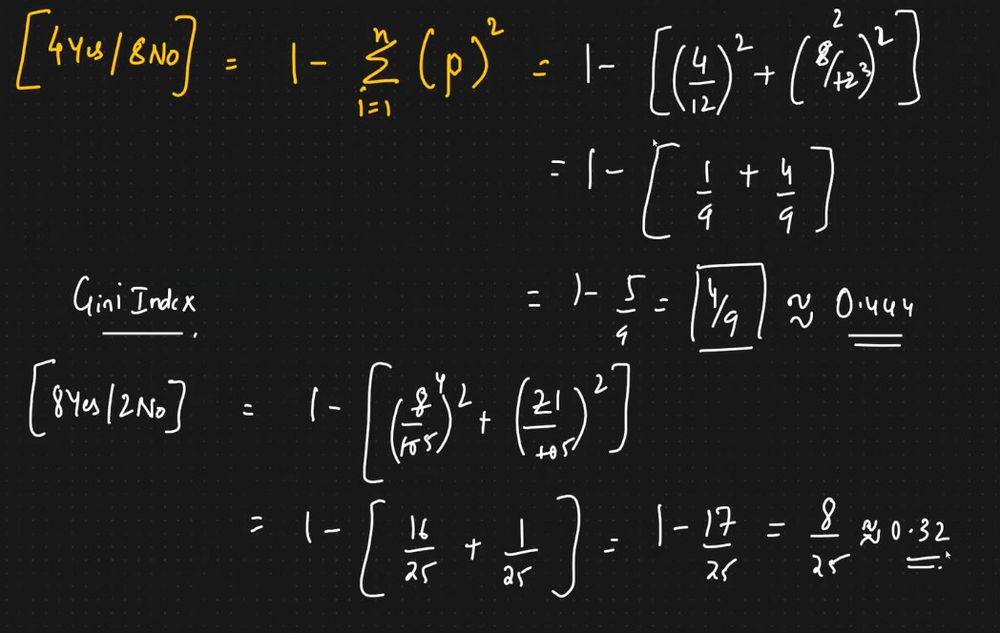


# GINI INDEX maximum values is 0.5 for the worst splitting

* GINI is friendlier in large calculation since it does not need a log calculation as per ENTROPHY

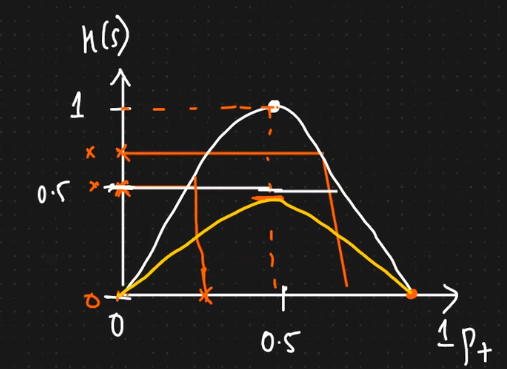

### Information Gain - Which category to use first for splitting

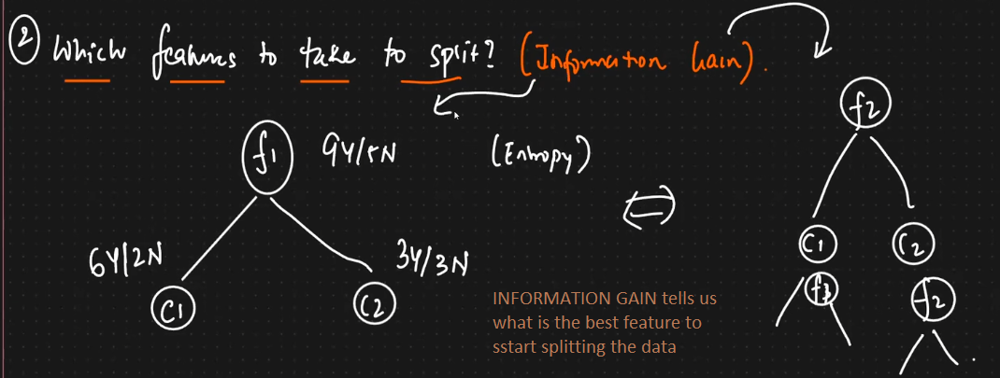

* calculate the entropy of the root

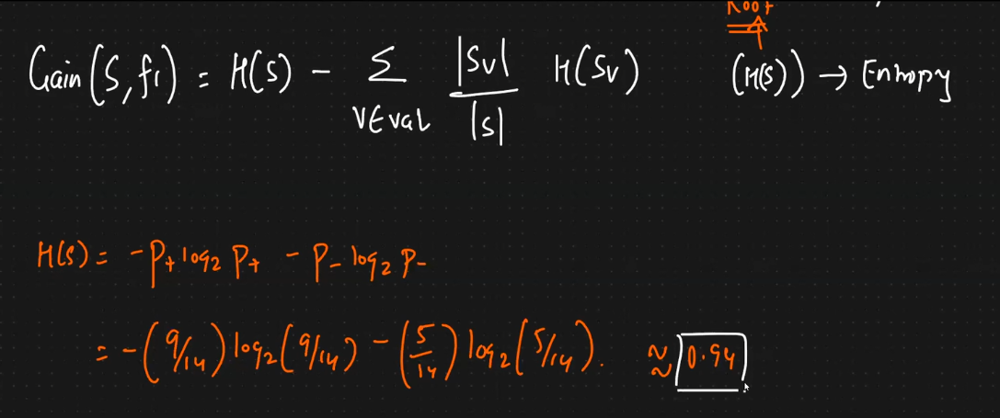

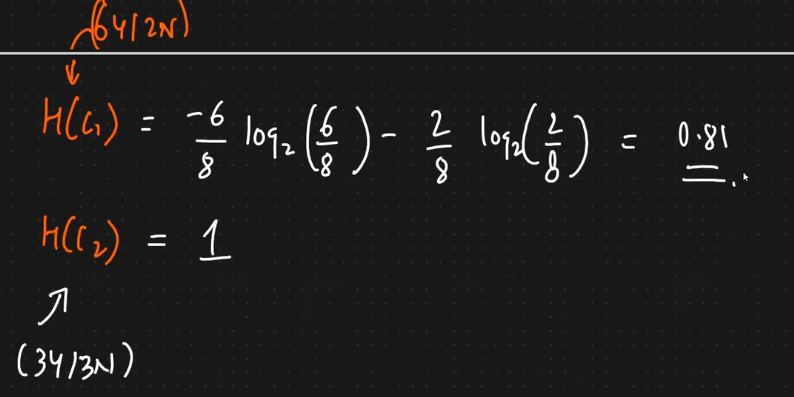

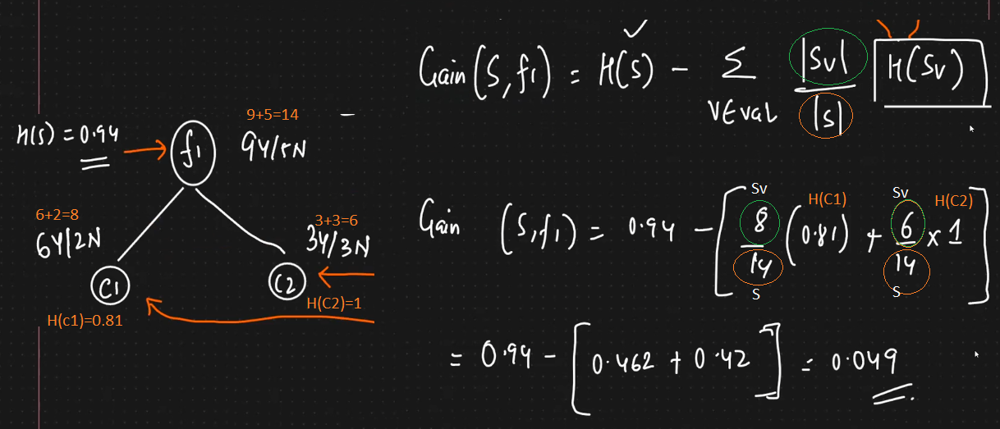

* We do the same split for the other features f2,f3,...  etc.. the calcualtion of the feature that provides the higher information gain is the one to be used as the first splitting feature.

* for the next feature the iinformation gain is:
  
  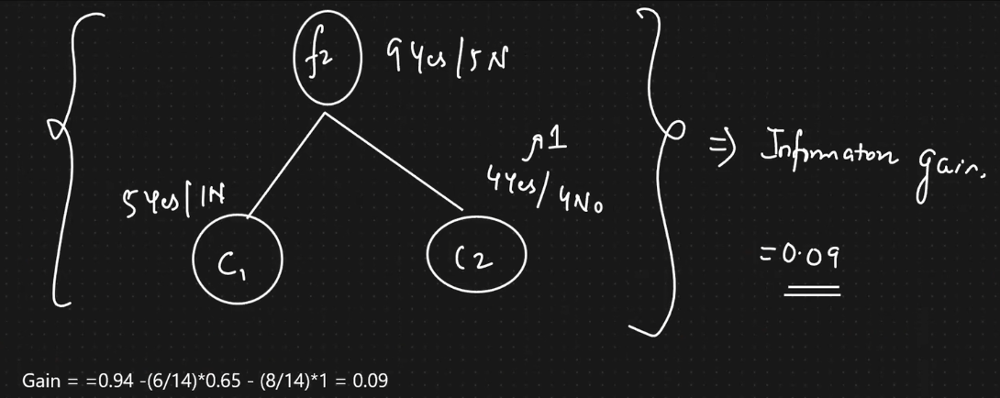
  
  * Note - we see that the information gain (feature 2) > information gain (feature 1), therefore we select feature 2 for splitting first
    

* we can see that we need to calcualte the information gain to decide what feature to use first, 
* once that feature is selected we repeat the process to find what feature to use second, etc..

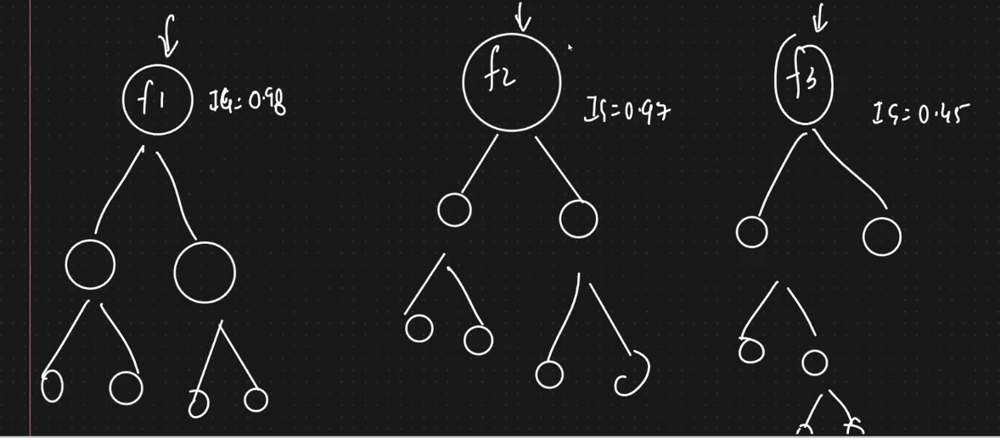


* Numerical Features - CART

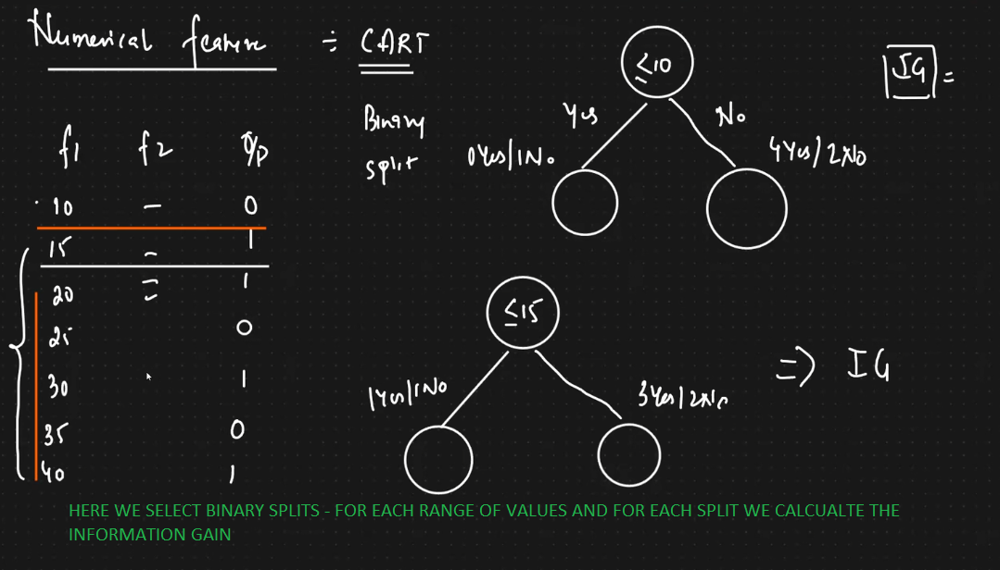

# DECISION TREE FOR CONTINUOES VALUES


* In this case we first calcualte the mean value (of the output continuos feature) for the root

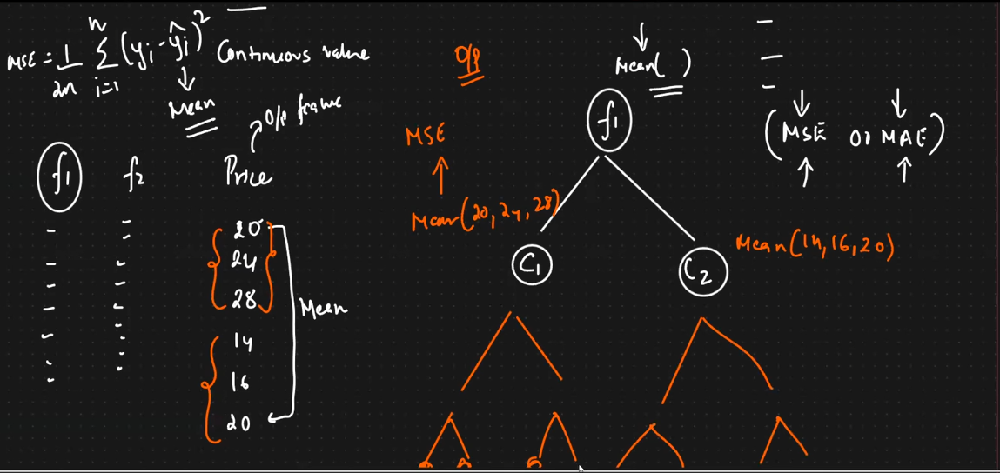

Example calculation, 
* the red vertical dotted line separate the two groups, this is the first iteration therefore the first group has one value at the left (from the red dotted line) and the remaining values are ar the right.
* the mean value for the values of the rigth part gets calculated (green horizontal line)
* the sum of squared residual is calcualted
* a graph of sum squared residuals for different iterations get also caculated
* the iteration with the smallers ssr is the best splitting value

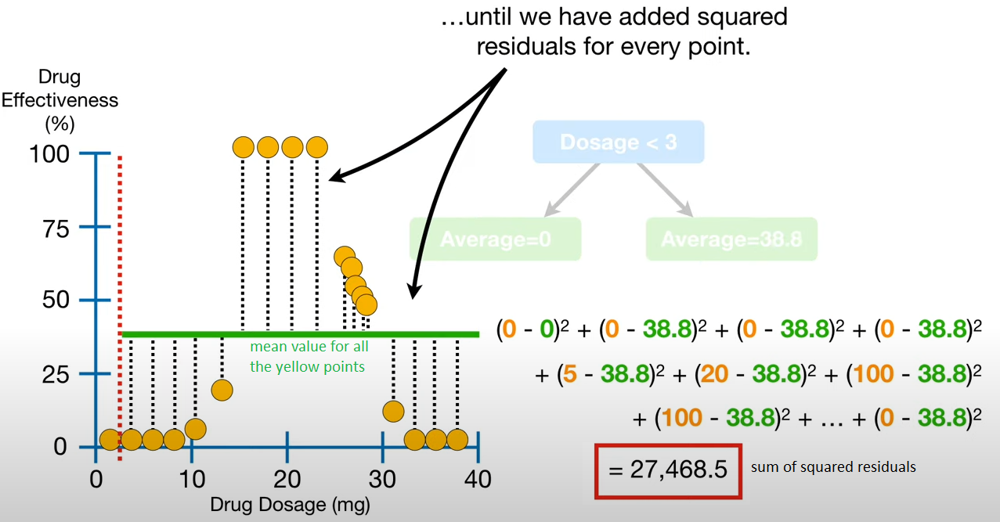

* here is the last iteration calculation, now the left side (from the red dotted line) has all the values but the last one
* the mean value for the values on the left(green horizontal line) and right part gets calculated

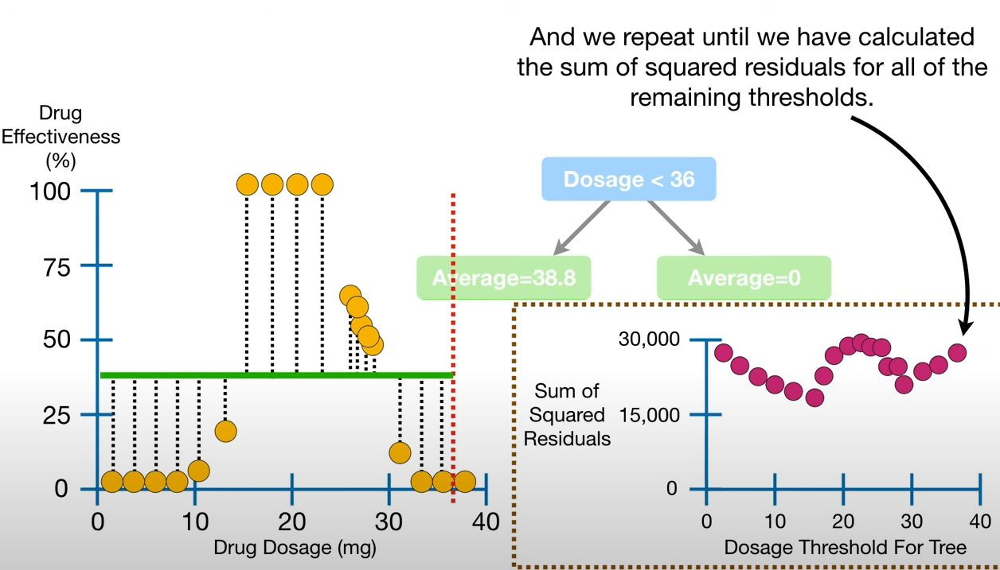

* notice also the graph showing the results for the ssr for each iteration

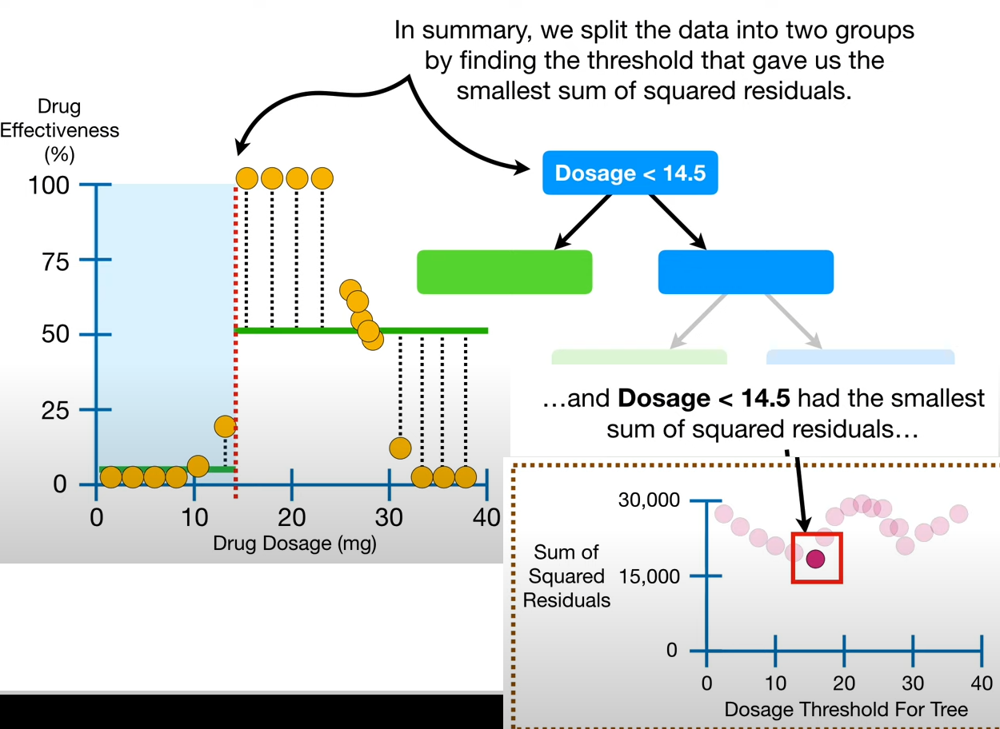

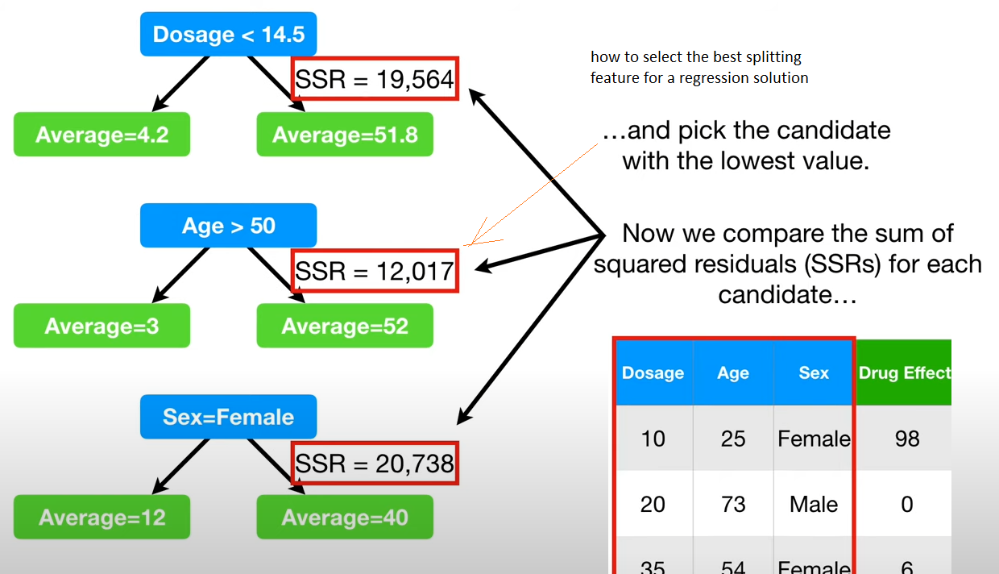

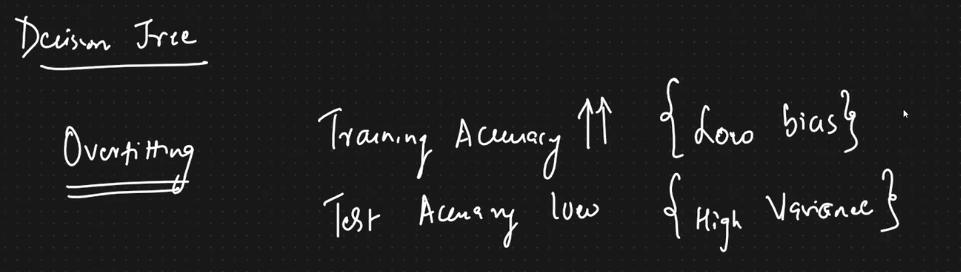

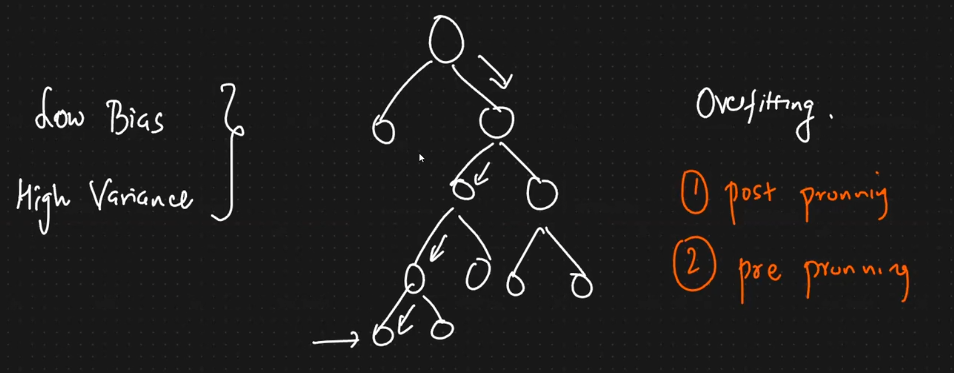

* you can compensate overfitting by using parameters such max depth, splitter (best, random), min_samples_split

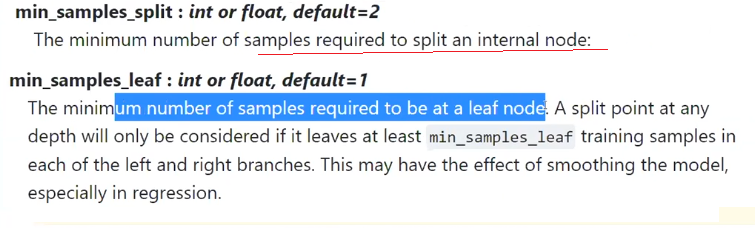

In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [8]:
df = sns.load_dataset("iris")
df

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,virginica
146,6.3,2.5,5.0,1.9,virginica
147,6.5,3.0,5.2,2.0,virginica
148,6.2,3.4,5.4,2.3,virginica


In [9]:
df.species.unique()

array(['setosa', 'versicolor', 'virginica'], dtype=object)

In [10]:
df["species"] = df.species.map({"setosa":0,"versicolor":1,"virginica":2})
df

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,2
146,6.3,2.5,5.0,1.9,2
147,6.5,3.0,5.2,2.0,2
148,6.2,3.4,5.4,2.3,2


In [12]:
from sklearn.tree import DecisionTreeClassifier
classifier = DecisionTreeClassifier(criterion="entropy")   # overfitting DT
classifier.fit(df.iloc[:,:-1], df.iloc[:,-1])

DecisionTreeClassifier(criterion='entropy')

Note : the major desadvantages of DT is that once you get a big dataset, make sense of the DT becomes challenging.
* when you have too many features DO NOT DO POSTPRUNNING (small dataset), you have to do PREPRUNNING (big dataset)
* Do GridSearchCV, CrossValScore(internally use cv with all the main parameters for DT and select the best one to produce PREPRUNNING.
* entropy on the child note is allways between 0-1

[Text(418.5, 498.3, 'X[2] <= 2.45\nentropy = 1.585\nsamples = 150\nvalue = [50, 50, 50]'),
 Text(354.11538461538464, 407.70000000000005, 'entropy = 0.0\nsamples = 50\nvalue = [50, 0, 0]'),
 Text(482.8846153846154, 407.70000000000005, 'X[3] <= 1.75\nentropy = 1.0\nsamples = 100\nvalue = [0, 50, 50]'),
 Text(257.53846153846155, 317.1, 'X[2] <= 4.95\nentropy = 0.445\nsamples = 54\nvalue = [0, 49, 5]'),
 Text(128.76923076923077, 226.5, 'X[3] <= 1.65\nentropy = 0.146\nsamples = 48\nvalue = [0, 47, 1]'),
 Text(64.38461538461539, 135.89999999999998, 'entropy = 0.0\nsamples = 47\nvalue = [0, 47, 0]'),
 Text(193.15384615384616, 135.89999999999998, 'entropy = 0.0\nsamples = 1\nvalue = [0, 0, 1]'),
 Text(386.3076923076923, 226.5, 'X[3] <= 1.55\nentropy = 0.918\nsamples = 6\nvalue = [0, 2, 4]'),
 Text(321.9230769230769, 135.89999999999998, 'entropy = 0.0\nsamples = 3\nvalue = [0, 0, 3]'),
 Text(450.69230769230774, 135.89999999999998, 'X[2] <= 5.45\nentropy = 0.918\nsamples = 3\nvalue = [0, 2, 1]')

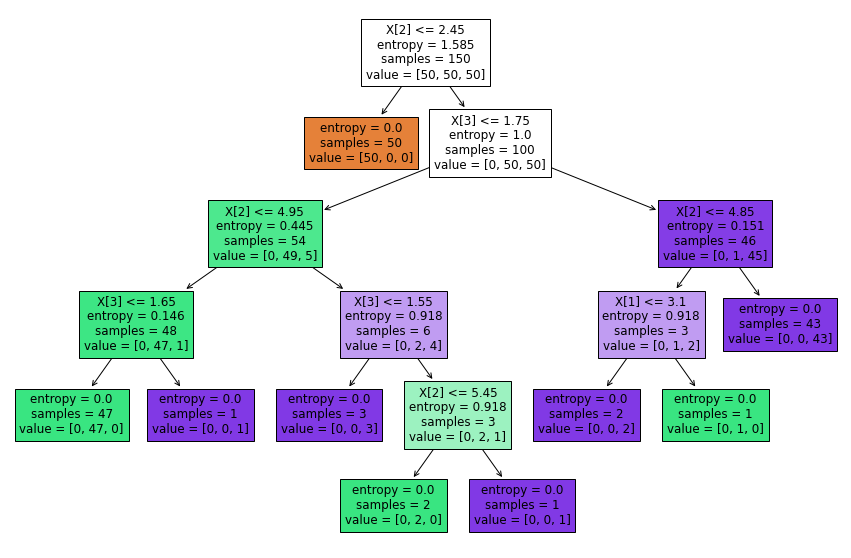

In [13]:
from sklearn import tree
plt.figure(figsize=(15,10))
tree.plot_tree(classifier, filled=True)

[Text(334.8, 453.0, 'X[2] <= 2.45\nentropy = 1.585\nsamples = 150\nvalue = [50, 50, 50]'),
 Text(167.4, 271.8, 'entropy = 0.0\nsamples = 50\nvalue = [50, 0, 0]'),
 Text(502.20000000000005, 271.8, 'X[3] <= 1.75\nentropy = 1.0\nsamples = 100\nvalue = [0, 50, 50]'),
 Text(334.8, 90.59999999999997, 'entropy = 0.445\nsamples = 54\nvalue = [0, 49, 5]'),
 Text(669.6, 90.59999999999997, 'entropy = 0.151\nsamples = 46\nvalue = [0, 1, 45]')]

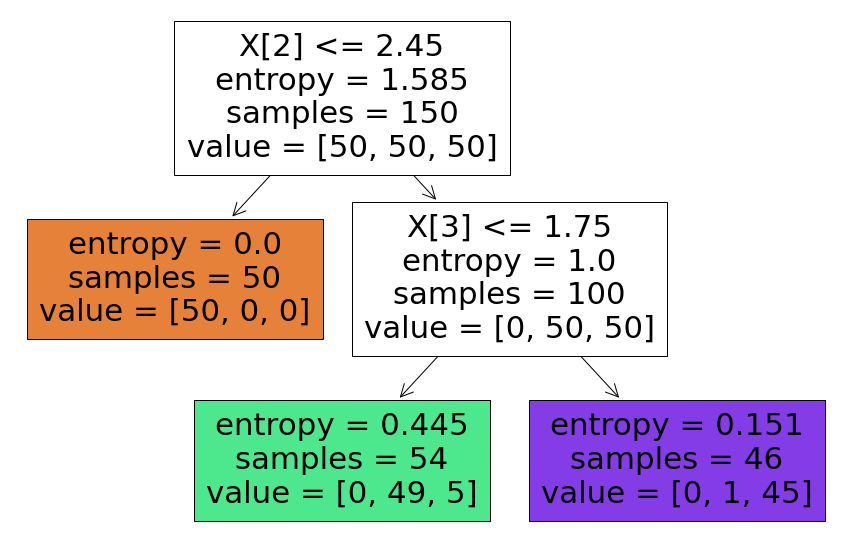

In [14]:
# postprunning to max depth 

classifier = DecisionTreeClassifier(criterion="entropy", max_depth=2)   # overfitting DT
classifier.fit(df.iloc[:,:-1], df.iloc[:,-1])

plt.figure(figsize=(15,10))
tree.plot_tree(classifier, filled=True)

[Text(418.5, 498.3, 'X[2] <= 2.45\ngini = 0.667\nsamples = 150\nvalue = [50, 50, 50]'),
 Text(354.11538461538464, 407.70000000000005, 'gini = 0.0\nsamples = 50\nvalue = [50, 0, 0]'),
 Text(482.8846153846154, 407.70000000000005, 'X[3] <= 1.75\ngini = 0.5\nsamples = 100\nvalue = [0, 50, 50]'),
 Text(257.53846153846155, 317.1, 'X[2] <= 4.95\ngini = 0.168\nsamples = 54\nvalue = [0, 49, 5]'),
 Text(128.76923076923077, 226.5, 'X[3] <= 1.65\ngini = 0.041\nsamples = 48\nvalue = [0, 47, 1]'),
 Text(64.38461538461539, 135.89999999999998, 'gini = 0.0\nsamples = 47\nvalue = [0, 47, 0]'),
 Text(193.15384615384616, 135.89999999999998, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1]'),
 Text(386.3076923076923, 226.5, 'X[3] <= 1.55\ngini = 0.444\nsamples = 6\nvalue = [0, 2, 4]'),
 Text(321.9230769230769, 135.89999999999998, 'gini = 0.0\nsamples = 3\nvalue = [0, 0, 3]'),
 Text(450.69230769230774, 135.89999999999998, 'X[2] <= 5.45\ngini = 0.444\nsamples = 3\nvalue = [0, 2, 1]'),
 Text(386.3076923076923, 45.

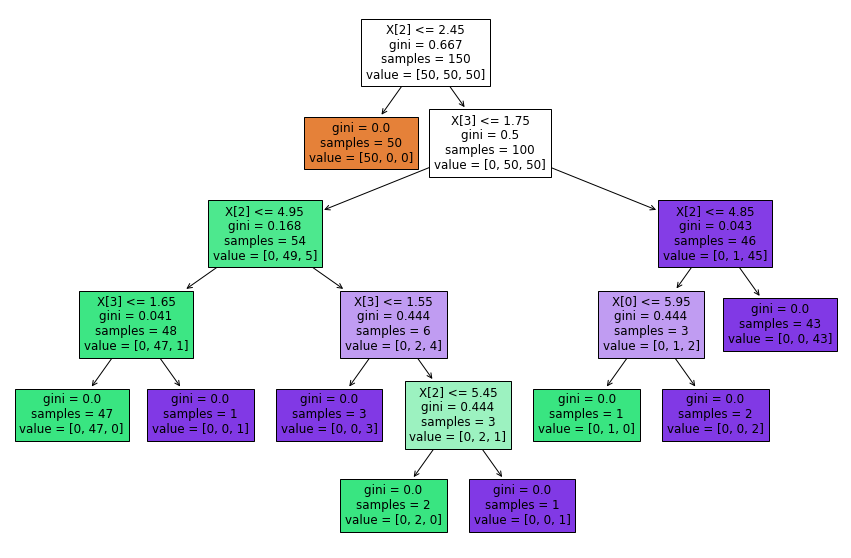

In [15]:
# ginni index

classifier = DecisionTreeClassifier()   # overfitting DT, ginni by default 
classifier.fit(df.iloc[:,:-1], df.iloc[:,-1])

plt.figure(figsize=(15,10))
tree.plot_tree(classifier, filled=True)

# Assignment :
preprunning - grid search and cross_val_score assignment

In [16]:
# preprunning grid search

from sklearn.model_selection import GridSearchCV

params = {"criterion":["gini","entropy"], "max_depth":[2,4,6,8,10,12], 
                       "min_samples_split":[2,3,4], "min_samples_leaf":[2,4,6]}
dtree_clf = DecisionTreeClassifier()
dtree_clf_gcv = GridSearchCV(estimator=dtree_clf, param_grid = params, cv=5)
dtree_clf_gcv.fit(df.iloc[:,:-1], df.iloc[:,-1])

print(dtree_clf_gcv.best_params_)


{'criterion': 'gini', 'max_depth': 4, 'min_samples_leaf': 4, 'min_samples_split': 2}


[Text(372.0, 489.24, 'X[2] <= 2.45\ngini = 0.667\nsamples = 150\nvalue = [50, 50, 50]'),
 Text(279.0, 380.52000000000004, 'gini = 0.0\nsamples = 50\nvalue = [50, 0, 0]'),
 Text(465.0, 380.52000000000004, 'X[3] <= 1.75\ngini = 0.5\nsamples = 100\nvalue = [0, 50, 50]'),
 Text(279.0, 271.8, 'X[2] <= 4.95\ngini = 0.168\nsamples = 54\nvalue = [0, 49, 5]'),
 Text(186.0, 163.08000000000004, 'X[0] <= 5.05\ngini = 0.041\nsamples = 48\nvalue = [0, 47, 1]'),
 Text(93.0, 54.360000000000014, 'gini = 0.375\nsamples = 4\nvalue = [0, 3, 1]'),
 Text(279.0, 54.360000000000014, 'gini = 0.0\nsamples = 44\nvalue = [0, 44, 0]'),
 Text(372.0, 163.08000000000004, 'gini = 0.444\nsamples = 6\nvalue = [0, 2, 4]'),
 Text(651.0, 271.8, 'X[2] <= 4.95\ngini = 0.043\nsamples = 46\nvalue = [0, 1, 45]'),
 Text(558.0, 163.08000000000004, 'gini = 0.278\nsamples = 6\nvalue = [0, 1, 5]'),
 Text(744.0, 163.08000000000004, 'gini = 0.0\nsamples = 40\nvalue = [0, 0, 40]')]

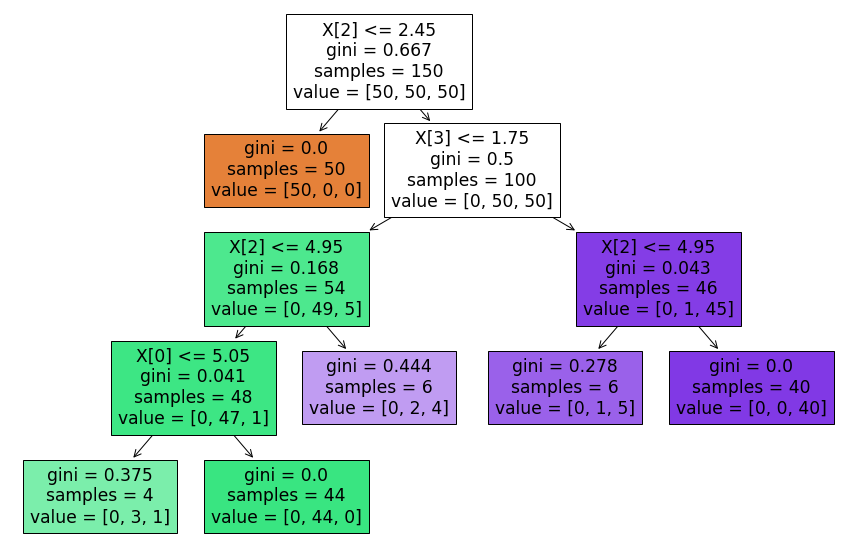

In [17]:
dtree_clf = DecisionTreeClassifier(criterion='gini', max_depth= 4, min_samples_leaf= 4, min_samples_split= 2)
dtree_clf.fit(df.iloc[:,:-1], df.iloc[:,-1])

plt.figure(figsize=(15,10))
tree.plot_tree(dtree_clf, filled=True)

# Regression DT

when NAN in the output feature, what is the approach?

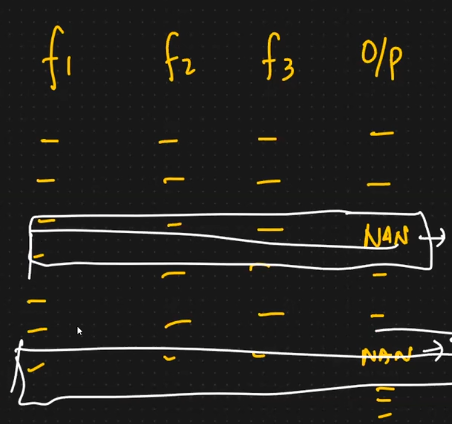

1- convert NAN into text data, if the text data (NAN values) are not that many, then you could traing your model with lets say 70% of the data and predict for the text values

2- separate the NAN rows, from the good data train the model, then add the NAN to the test data and predict, this way you trained the model with good complete data and all the nan and test data gets predicted later on.

3- when doing the above approaches i want my model to overfit so i can find the NAN values

4- use knn to fit this NAN problem.